<a href="https://colab.research.google.com/github/Mrymvaa/Rainfall-prediction-using-ANN/blob/main/Rain_Prediction_Final_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Programming for Data Analytics 2 Project**
November - December 2022

Done by: 
- Maryam Almetnawy
- Raghad Yousef
- Reem Abu Hasna

Supervised by: Dr.Salam Fraihat and Eng.Abdulrahman Al Muiatah



##Business problem

Weather forecasting can help with a farmer’s business decisions. Forecasts can help them plan for the many day-to-day decisions. These decisions include crop irrigation, time to fertilize, and what days are suitable for working in the field. 

To produce a successful crop, a farmer needs to be aware of the moisture, light, and temperature. Detailed weather information, which includes past records, present weather and future forecasts are required. 
Rain is usually seen as a benefit to crops and fields, but there is an “ideal” amount of rainfall in any given growing season for most crops.

Based on the predicted rain for today and tomorrow, farmers would be able to make decisions on when to plant and use the available water in the farm to water the crop until rain comes!




**Dataset to use:** https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package

Business Questions to answer:
1. How well can we predict rainfall for farmers?
2. Which months can farmers expect rain the most?
3. How high is rainfall at different locations?




**How well can we predict rain tomorrow?**



> Indented block



#Data Description

###This dataset contains about 10 years of daily weather observations from many locations across Australia.

date - Today's date.

location - Location in Australia where the weather observations were collected.

min_temp - Minimum temperature in the 24 hours to 9am (in degrees Celsius).

max_temp - Maximum temperature in the 24 hours from 9am (in degrees Celsius).

rainfall - Precipitation (rainfall) in the 24 hours to 9am (in millimetres).

evaporation - Evaporation in the 24 hours to 9am (in millimetres).

sunshine - Bright sunshine in the 24 hours to midnight (in hours).

wind_gust_dir - Direction of strongest gust in the 24 hours to midnight (in compass points).

wind_gust_speed - Speed of strongest wind gust in the 24 hours to midnight (in kilometres per hour).

wind_dir_9am - Wind direction averaged over 10 minutes prior to 9 am (in compass points).

wind_dir_3pm - Wind direction averaged over 10 minutes prior to 3 pm (in compass points).

wind_speed_9am - Wind speed averaged over 10 minutes prior to 9 am (in kilometres per hour).

wind_speed_3pm - Wind speed averaged over 10 minutes prior to 3 pm (in kilometres per hour).

humidity_9am - Relative humidity at 9 am (in percentage).

humidity_3pm - Relative humidity at 3 pm (in percentage).

pressure_9am - Atmospheric pressure reduced to mean sea level at 9 am (in hectopascals).

pressure_3pm - Atmospheric pressure reduced to mean sea level at 3 pm (in hectopascals).

cloud_9am - Fraction of sky obscured by cloud at 9 am (in eighths).

cloud_3pm - Fraction of sky obscured by cloud at 3 pm (in eighths).

temp_9am - Temperature at 9 am (in degrees Celsius).

temp_3pm - Temperature at 3 pm (in degrees Celsius).

rain_today - Whether rain has fallen today (0=No, 1=Yes).

rain_tomorrow - Whether it will rain the next day (0=No, 1=Yes).

#Exploratory Data Analysis

In [4]:
import pandas as pd
import numpy as np 
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Mounted at /content/gdrive


In [5]:
df = pd.read_csv('/content/gdrive/MyDrive/weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


- alot of missing values
- most of the attributes are numerical
- date attribute can be derived into 2 other attributes (months and year)
-


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [7]:
df.isnull().sum(axis = 0)

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

- Min temperature detected is 12 degrees
- Max temperature is 48 degrees
- highest rainfall = 145 mm
- highest sunshine detected = 135
- Average rainfall is 2.4 and sunshine = 7.6
- we can also notice that most of the data is skewed, so it can be a good way to use the central tendancy measures to impute the missing values

In [8]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [9]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64

#Data Pre-processing
- Checking the correlation
- Handling imbalancement of the data by applying resampling
- Filling the missing values
- Checking for outliers


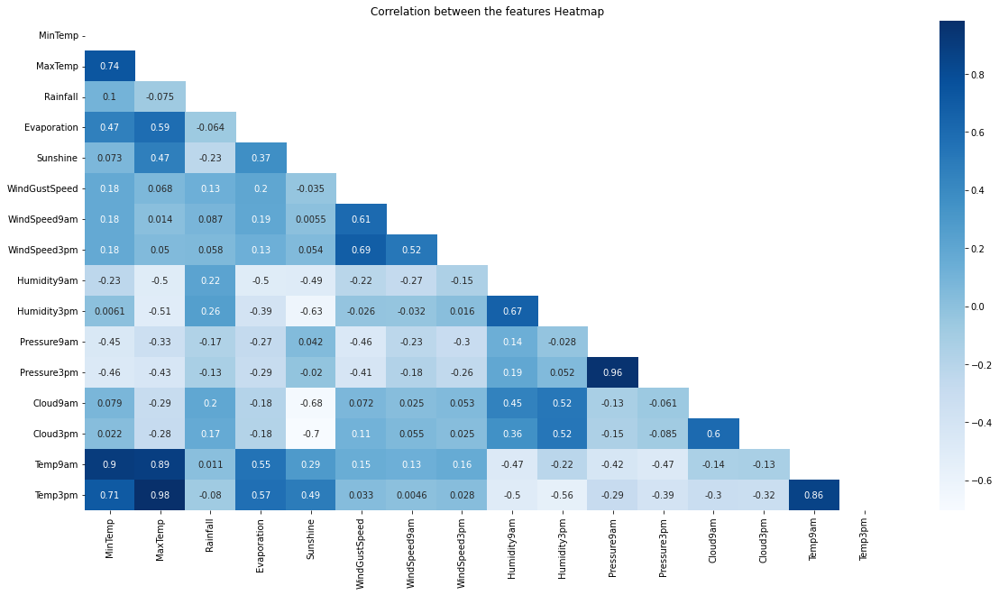

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20, 10))
mask = np.triu((df.corr())) # returns the triangle upper array of the heatmap
heatmap = sns.heatmap(df.corr(), mask=mask, annot=True, cmap='Blues') #chose this color so you can see the differences clearly
heatmap.set_title('Correlation between the features Heatmap');


> having high null values = drop
- Evaporation      62790
- Sunshine         69835
- Cloud9am         55888
- Cloud3pm         59358

Only Date column have very high cardinality(no of unique value) and we will convert it to datetime


In [11]:
df.duplicated().sum()

0

## handling missing values 
**using imputation of central tendancy measures**
> Filling the categorical values with the mode 


> Filligf the numerical values with the median





In [12]:
categorical_cols = ['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow'] #categorical values
for i in categorical_cols:
    df[i].fillna(df[i].mode()[0], inplace=True)


In [13]:
df[categorical_cols].info() #checking null values after filling the categoricals

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   WindGustDir   145460 non-null  object
 1   WindDir9am    145460 non-null  object
 2   WindDir3pm    145460 non-null  object
 3   RainToday     145460 non-null  object
 4   RainTomorrow  145460 non-null  object
dtypes: object(5)
memory usage: 5.5+ MB


In [14]:
t = (df.dtypes == "float64")
cols = list(t[t].index) #numerical values
cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [15]:
df[cols]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4
145456,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5
145457,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1
145458,7.8,27.0,0.0,NaN,NaN,28.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0


In [16]:
for col in cols:
 df[col] = df[col].fillna((df[col].median()))#filling the numerical features with the mean = cleaned df


In [17]:
df.head() #filled all missing values and dataset is cleaned rn

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.8,8.4,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.8,8.4,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,4.8,8.4,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.8,8.4,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [18]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

## Checking for imbalancement 

There is a huge imbalanced difference between the values, this may cause an issue when trying to feed it to the ANN model
- dealt with after splitting the model for training and testing

In [19]:
df['RainTomorrow'].value_counts()

No     113583
Yes     31877
Name: RainTomorrow, dtype: int64

In [20]:
df['RainToday'].value_counts()

No     113580
Yes     31880
Name: RainToday, dtype: int64

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Rain tomorrow imbalancement')

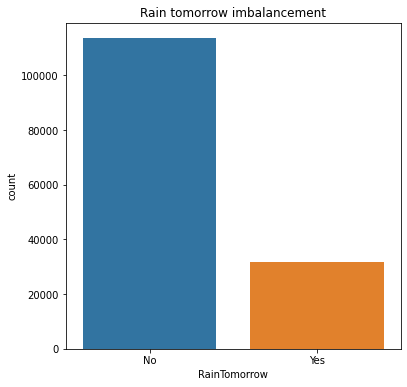

In [21]:
plt.figure(figsize=(6,6))
sns.countplot(df['RainTomorrow']);
plt.title('Rain tomorrow imbalancement')

## Checking for outliers
we're not removing the outliers, because having values that are highly different than usual makes sense. Some days would have normal predictions of rainfall while other days might have extremely high predicted rain.

Therefore, standardizing the dataset and removing any outliers is the best course of action here.

In [22]:
#with outliers 
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,12.192053,23.215962,2.307990,5.179779,7.989889,39.962189,14.030751,18.669758,68.901251,51.553396,1017.644768,1015.250115,4.659755,4.709913,16.987101,21.668916
std,6.365780,7.088358,8.389771,3.178819,2.757790,13.120931,8.861796,8.716716,18.855360,20.471345,6.728484,6.663994,2.281490,2.106768,6.449299,6.850658
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.700000,18.000000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.100000,3.000000,4.000000,12.300000,16.700000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.600000,5.200000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.400000,6.000000,6.000000,21.500000,26.200000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


In [23]:

import plotly.graph_objects as go
import numpy as np

go_fig = go.Figure()
obj_one = go.Box(y = df['MinTemp'], name="MinTemp")
obj_two = go.Box(y = df['Rainfall'], name="Rainfall")
obj_three = go.Box(y = df['WindGustSpeed'], name="WindGustSpeed")
obj_four= go.Box(y = df['WindSpeed9am'], name="WindSpeed9am") 
obj_five= go.Box(y = df['WindSpeed3pm'], name="WindSpeed3pm") 
obj_six = go.Box(y = df['Humidity9am'], name="Humidity9am")
obj_seven= go.Box(y = df['Humidity3pm'], name="Humidity3pm")
obj_eight= go.Box(y = df['Pressure3pm'], name="Pressure3pm")
obj_nine= go.Box(y = df['Pressure9am'], name="Pressure9am")
obj_ten= go.Box(y = df['Temp9am'], name="Temp9am")
obj_eleven= go.Box(y = df['Temp3pm'], name="Temp3pm")
go_fig.add_trace(obj_one)
go_fig.add_trace(obj_two)
go_fig.add_trace(obj_three)
go_fig.add_trace(obj_four)
go_fig.add_trace(obj_five)
go_fig.add_trace(obj_six)
go_fig.add_trace(obj_seven)
go_fig.add_trace(obj_eight)
go_fig.add_trace(obj_nine)
go_fig.add_trace(obj_ten)
go_fig.add_trace(obj_eleven)
go_fig.show()

In [24]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,12.192053,23.215962,2.307990,5.179779,7.989889,39.962189,14.030751,18.669758,68.901251,51.553396,1017.644768,1015.250115,4.659755,4.709913,16.987101,21.668916
std,6.365780,7.088358,8.389771,3.178819,2.757790,13.120931,8.861796,8.716716,18.855360,20.471345,6.728484,6.663994,2.281490,2.106768,6.449299,6.850658
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.700000,18.000000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.100000,3.000000,4.000000,12.300000,16.700000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.600000,5.200000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.400000,6.000000,6.000000,21.500000,26.200000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


#Visualizations

**How high is rainfall at different locations?**

Locations have a big impact on daily rain.

some locations experience more rainy days than others, Darwin gets an average of 6% rainfall daily while Woomera on the other hand gets only 1% of rainfall daily!

Top three cities with rainfall 
1. Darwin = 6.12
2. Carins = 5.65
3. CoffsHarbour = 5.46

In [25]:
#getting the average of rainy days at each location
import plotly.express as px
px.histogram(df,x='Location',y='Rainfall',title='Location vs Average Rainy Days',histfunc='avg')

**Which month can farmers expect rain the most?**

As seen in the following bar chart, Australia's most rainy days are during the summer, June, July and August. So farmers should be ready for any possibilty of rain during those month. 

Unlike in the winter, where you can rarely expect rain in Australia.

In [26]:
df.head(2)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.8,8.4,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No


In [27]:
df['Date'] = pd.to_datetime(df['Date'])

In [28]:
df = df.set_index('Date')
df.tail(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2017-06-23,Uluru,5.4,26.9,0.0,4.8,8.4,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No
2017-06-24,Uluru,7.8,27.0,0.0,4.8,8.4,SE,28.0,SSE,N,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
2017-06-25,Uluru,14.9,22.6,0.0,4.8,8.4,W,39.0,ESE,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,No


In [29]:
# Adding columns with year, month, day, and week
df['Year'] = df.index.year
df['Month'] = df.index.month
df['Day'] = df.index.day
df.tail(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,,,,
2017-06-23,Uluru,5.4,26.9,0.0,4.8,8.4,N,37.0,SE,WNW,...,1016.8,5.0,5.0,12.5,26.1,No,No,2017,6,23
2017-06-24,Uluru,7.8,27.0,0.0,4.8,8.4,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24
2017-06-25,Uluru,14.9,22.6,0.0,4.8,8.4,W,39.0,ESE,ESE,...,1017.9,8.0,8.0,15.0,20.9,No,No,2017,6,25


Text(0.5, 1.0, 'Rain vs Month')

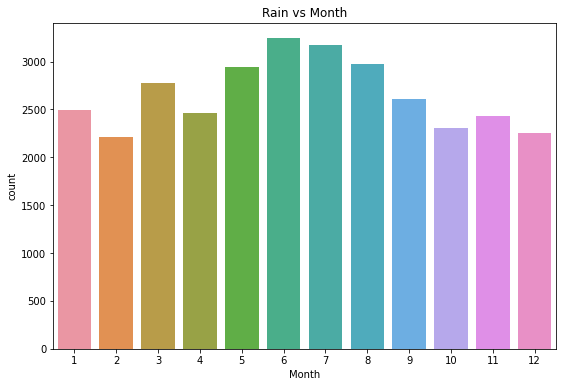

In [30]:
plt.figure(figsize=(9,6))
sns.countplot(data=df[df['RainTomorrow']=='Yes'],x='Month');
plt.title('Rain vs Month')

We can also notice that 2016 had the highest possibilty of rain than other past years.

Text(0.5, 1.0, 'Rain Tomorrow vs Year')

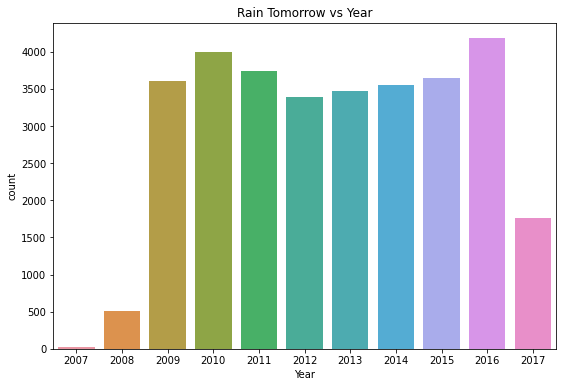

In [31]:
plt.figure(figsize=(9,6))
sns.countplot(data=df[df['RainTomorrow']=='Yes'],x='Year');
plt.title('Rain Tomorrow vs Year')

In [32]:
#sns.lineplot(x="Day",y="MaxTemp",hue="RainTomorrow",data=df);

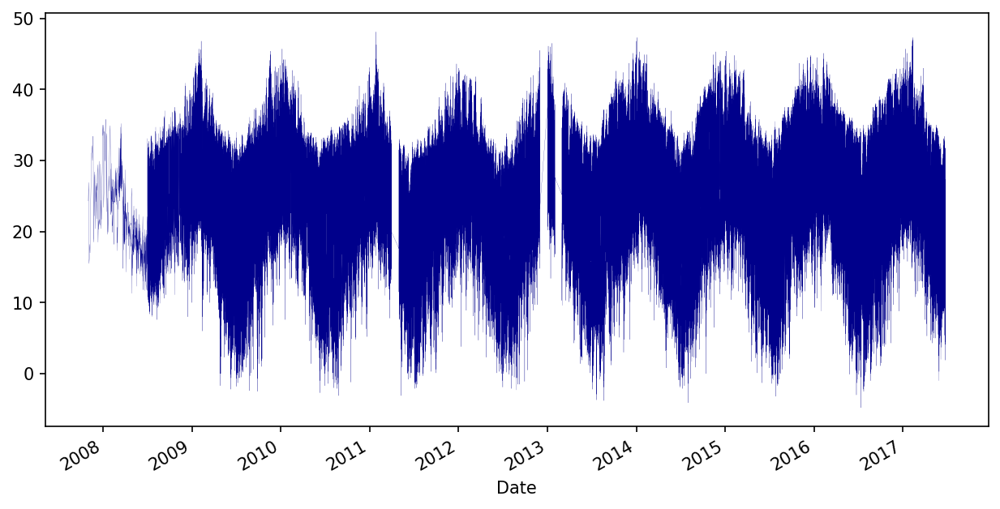

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 150
df['MaxTemp'].plot(linewidth=0.1,color='darkblue')


> The likelihood of rain tomorrow is higher if the temperature difference between the minimum and maximum temperatures is small.

#Modeling 
- Encoding the categorical attributes
- splitting the data into train and test
- creating a sequential classification model
- regualarization
- evaluation
- testing predictions of rain tomorrow using the model


In [34]:
import tensorflow as tf
from   tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

In [35]:
from sklearn.preprocessing import OrdinalEncoder
ce = OrdinalEncoder() 
df[['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow','Location']] = ce.fit_transform(df[['WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow','Location']])

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145460 entries, 2008-12-01 to 2017-06-25
Data columns (total 25 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  float64
 1   MinTemp        145460 non-null  float64
 2   MaxTemp        145460 non-null  float64
 3   Rainfall       145460 non-null  float64
 4   Evaporation    145460 non-null  float64
 5   Sunshine       145460 non-null  float64
 6   WindGustDir    145460 non-null  float64
 7   WindGustSpeed  145460 non-null  float64
 8   WindDir9am     145460 non-null  float64
 9   WindDir3pm     145460 non-null  float64
 10  WindSpeed9am   145460 non-null  float64
 11  WindSpeed3pm   145460 non-null  float64
 12  Humidity9am    145460 non-null  float64
 13  Humidity3pm    145460 non-null  float64
 14  Pressure9am    145460 non-null  float64
 15  Pressure3pm    145460 non-null  float64
 16  Cloud9am       145460 non-null  float64
 17  Cloud3pm     

# Training & Testing



## Handling imbalancement
There is a huge imbalanced difference between the values, this may cause an issue when trying to feed it to the ANN model:



> instantiating over and under sampling to the target attribute


The concept is that we can apply a modest amount of oversampling to the minority class samples, which improves the bias to the minority class, 
whilst we also perform a modest amount of undersampling on the majority class to reduce the bias on the majority class samples.

In [37]:
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

In [38]:
X = df.drop(['Day','Year','Month','RainTomorrow','RainToday'],axis=1).values
y=df[['RainTomorrow']].values
print(X.shape)
print(y.shape)


(145460, 20)
(145460, 1)


In [39]:
# instantiating over and under sampler
over = RandomOverSampler(sampling_strategy=0.5)
under = RandomUnderSampler(sampling_strategy=0.7)
# first performing oversampling to minority class
x_sampling=X
y_sampling=y



In [40]:
x_over, y_over = over.fit_resample(x_sampling,y_sampling)
print(f"Oversampled: {Counter(y_over)}")

Oversampled: Counter({0.0: 113583, 1.0: 56791})


In [41]:
# now to comine under sampling 
x_combined_sampling, y_combined_sampling = under.fit_resample(x_over, y_over)
print(f"Combined Random Sampling: {Counter(y_combined_sampling)}")

Combined Random Sampling: Counter({0.0: 81130, 1.0: 56791})


##Handling outliers

In [42]:
#Removing Outliers from Numerical Features 

features_with_outliers = cols
for feature in features_with_outliers:
  q1 = df[feature].quantile(0.25)
  q3 = df[feature].quantile(0.75)
  IQR = q3-q1
  lower_limit = q1 - (IQR*1.5)
  upper_limit = q3 + (IQR*1.5)
  df.loc[df[feature]<lower_limit, feature] = lower_limit
  df.loc[df[feature]>upper_limit, feature] = upper_limit

#after running this the outliers will be removed from our numerical features of the data 

In [43]:
go_fig = go.Figure()
obj_one = go.Box(y = df['MinTemp'], name="MinTemp")
obj_two = go.Box(y = df['Rainfall'], name="Rainfall")
obj_three = go.Box(y = df['WindGustSpeed'], name="WindGustSpeed")
obj_four= go.Box(y = df['WindSpeed9am'], name="WindSpeed9am") 
obj_five= go.Box(y = df['WindSpeed3pm'], name="WindSpeed3pm") 
obj_six = go.Box(y = df['Humidity9am'], name="Humidity9am")
obj_seven= go.Box(y = df['Humidity3pm'], name="Humidity3pm")
obj_eight= go.Box(y = df['Pressure3pm'], name="Pressure3pm")
obj_nine= go.Box(y = df['Pressure9am'], name="Pressure9am")
obj_ten= go.Box(y = df['Temp9am'], name="Temp9am")
obj_eleven= go.Box(y = df['Temp3pm'], name="Temp3pm")
go_fig.add_trace(obj_one)
go_fig.add_trace(obj_two)
go_fig.add_trace(obj_three)
go_fig.add_trace(obj_four)
go_fig.add_trace(obj_five)
go_fig.add_trace(obj_six)
go_fig.add_trace(obj_seven)
go_fig.add_trace(obj_eight)
go_fig.add_trace(obj_nine)
go_fig.add_trace(obj_ten)
go_fig.add_trace(obj_eleven)
go_fig.show()

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Rain tomorrow imbalancement')

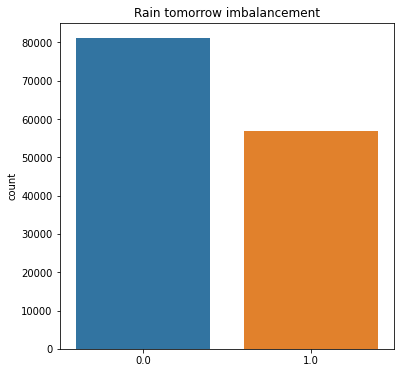

In [44]:
plt.figure(figsize=(6,6))
sns.countplot(y_combined_sampling);
plt.title('Rain tomorrow imbalancement')

In [45]:
df.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.00000,145460.00000,145460.000000,145460.000000,...,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,23.793524,12.192336,23.219758,0.381674,4.750932,8.422820,8.09360,39.64328,6.999526,7.798852,...,1015.268537,4.659755,4.744108,16.988207,21.671194,0.219167,0.219146,2012.769751,6.399615,15.712258
std,14.228687,6.364499,7.067804,0.608638,1.454089,0.676532,4.69411,12.17591,4.515839,4.538135,...,6.528909,2.281490,2.037004,6.440883,6.813343,0.413683,0.413669,2.537684,3.427262,8.794789
min,0.000000,-5.950000,2.700000,0.000000,2.200000,7.450000,0.00000,8.50000,0.000000,0.000000,...,998.650000,0.000000,1.000000,-1.500000,2.450000,0.000000,0.000000,2007.000000,1.000000,1.000000
25%,11.000000,7.700000,18.000000,0.000000,4.000000,8.200000,4.00000,31.00000,3.000000,4.000000,...,1011.100000,3.000000,4.000000,12.300000,16.700000,0.000000,0.000000,2011.000000,3.000000,8.000000
50%,24.000000,12.000000,22.600000,0.000000,4.800000,8.400000,9.00000,39.00000,7.000000,8.000000,...,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000,0.000000,2013.000000,6.000000,16.000000
75%,36.000000,16.800000,28.200000,0.600000,5.200000,8.700000,13.00000,46.00000,11.000000,12.000000,...,1019.400000,6.000000,6.000000,21.500000,26.200000,0.000000,0.000000,2015.000000,9.000000,23.000000
max,48.000000,30.450000,43.500000,1.500000,7.000000,9.450000,15.00000,68.50000,15.000000,15.000000,...,1031.850000,9.000000,9.000000,35.300000,40.450000,1.000000,1.000000,2017.000000,12.000000,31.000000


In [46]:
#after removing the outliers
df.mean()

Location           23.793524
MinTemp            12.192336
MaxTemp            23.219758
Rainfall            0.381674
Evaporation         4.750932
Sunshine            8.422820
WindGustDir         8.093600
WindGustSpeed      39.643280
WindDir9am          6.999526
WindDir3pm          7.798852
WindSpeed9am       13.939757
WindSpeed3pm       18.583126
Humidity9am        68.953025
Humidity3pm        51.553396
Pressure9am      1017.671706
Pressure3pm      1015.268537
Cloud9am            4.659755
Cloud3pm            4.744108
Temp9am            16.988207
Temp3pm            21.671194
RainToday           0.219167
RainTomorrow        0.219146
Year             2012.769751
Month               6.399615
Day                15.712258
dtype: float64

In [47]:
df.median()

Location           24.0
MinTemp            12.0
MaxTemp            22.6
Rainfall            0.0
Evaporation         4.8
Sunshine            8.4
WindGustDir         9.0
WindGustSpeed      39.0
WindDir9am          7.0
WindDir3pm          8.0
WindSpeed9am       13.0
WindSpeed3pm       19.0
Humidity9am        70.0
Humidity3pm        52.0
Pressure9am      1017.6
Pressure3pm      1015.2
Cloud9am            5.0
Cloud3pm            5.0
Temp9am            16.7
Temp3pm            21.1
RainToday           0.0
RainTomorrow        0.0
Year             2013.0
Month               6.0
Day                16.0
dtype: float64

In [48]:
df.mode().head(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,9.0,12.0,22.6,0.0,4.8,8.4,13.0,39.0,3.0,9.0,...,1015.2,5.0,5.0,16.7,21.1,0.0,0.0,2016.0,3.0,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5


In [49]:
x_train,x_test,y_train,y_test = train_test_split(x_combined_sampling, y_combined_sampling,test_size=0.20,random_state=4)

##ANN model

Normalization is used when the data doesn't have Gaussian distribution whereas Standardization is used on data having Gaussian distribution.

Normalization scales in a range of [0,1] or [-1,1]. 

Standardization is not bounded by range. Normalization is highly affected by outliers.

- creating the model
- compiling the model
- fitting the model 
- plotting to check for overfitting and loss

In [50]:
from sklearn.preprocessing import  StandardScaler
scaler = StandardScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [51]:
from keras import Sequential, Model, Input,regularizers

from keras import layers
from keras.regularizers import l2
from keras.layers import Dropout

from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam



> Model 1 
- Added the dropout layer due to having an overfitting.
- Whenever activation function is used as Sigmoid , Uniform works well.
- Determing the LR(steps ) to be 0.001 ,so we can increase the number of training epochs.
- Arranging the layers in a sequantial order ,the best choice is to stick with sequantial API.
- Relu activation function is advanced and is commonly used , we used relu af for our hidden layers ,because it does not activate all the neuorns at the same time.




In [52]:
earlystopping=EarlyStopping(monitor='val_loss',min_delta=0.001,patience=50,restore_best_weights=True)

In [53]:
model=Sequential()
model.add(Dense(20,input_dim=20,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=10,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=5,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=1,activation="sigmoid",kernel_initializer = 'uniform'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 20)                420       
                                                                 
 dense_1 (Dense)             (None, 10)                210       
                                                                 
 dense_2 (Dense)             (None, 5)                 55        
                                                                 
 dense_3 (Dense)             (None, 1)                 6         
                                                                 
Total params: 691
Trainable params: 691
Non-trainable params: 0
_________________________________________________________________


In [54]:
opt = Adam(learning_rate=0.0001)
model.compile(optimizer = opt,loss="binary_crossentropy",metrics=["accuracy"])

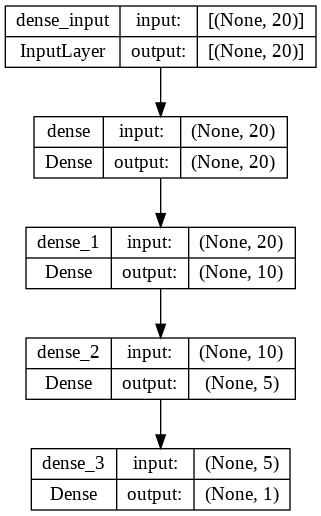

In [ ]:
tf.keras.utils.plot_model(model, show_shapes= True)

In [ ]:
history = model.fit(x_train,y_train,batch_size=64,epochs=150,
                      callbacks=[earlystopping],validation_data=(x_test,y_test))

Epoch 1/150
1724/1724 [==============================] - 4s 2ms/step - loss: 0.4449 - accuracy: 0.7943 - val_loss: 0.4504 - val_accuracy: 0.7893
Epoch 2/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4441 - accuracy: 0.7947 - val_loss: 0.4500 - val_accuracy: 0.7897
Epoch 3/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4434 - accuracy: 0.7951 - val_loss: 0.4496 - val_accuracy: 0.7898
Epoch 4/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4427 - accuracy: 0.7950 - val_loss: 0.4486 - val_accuracy: 0.7898
Epoch 5/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4420 - accuracy: 0.7959 - val_loss: 0.4486 - val_accuracy: 0.7896
Epoch 6/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4415 - accuracy: 0.7953 - val_loss: 0.4477 - val_accuracy: 0.7892
Epoch 7/150
1724/1724 [==============================] - 3s 2ms/step - loss: 0.4410 - accuracy: 0.7953 - val_loss: 0.4474 - val_ac

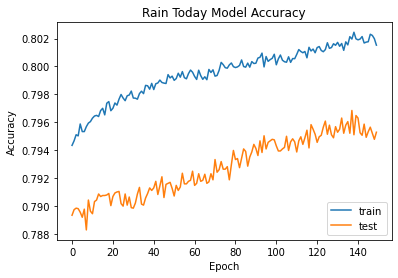

In [ ]:
#the first run for the model with using an early stopping 
from matplotlib import pyplot
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='test')
pyplot.title('Rain Today Model Accuracy')
pyplot.ylabel('Accuracy')
pyplot.xlabel('Epoch')
pyplot.legend(['train','test'],loc='lower right')
pyplot.show()

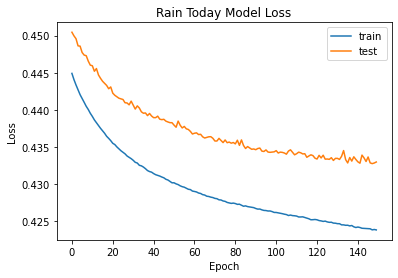

In [ ]:
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history
            .history['val_loss'], label='test')
pyplot.title('Rain Today Model Loss')
pyplot.ylabel('Loss')
pyplot.xlabel('Epoch')
pyplot.legend()
pyplot.show()

In [55]:
model=Sequential()
model.add(Dense(20,input_dim=20,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=10,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=5,activation="relu",kernel_initializer = 'uniform'))
model.add(Dense(units=1,activation="sigmoid",kernel_initializer = 'uniform'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 20)                420       
                                                                 
 dense_5 (Dense)             (None, 10)                210       
                                                                 
 dense_6 (Dense)             (None, 5)                 55        
                                                                 
 dense_7 (Dense)             (None, 1)                 6         
                                                                 
Total params: 691
Trainable params: 691
Non-trainable params: 0
_________________________________________________________________


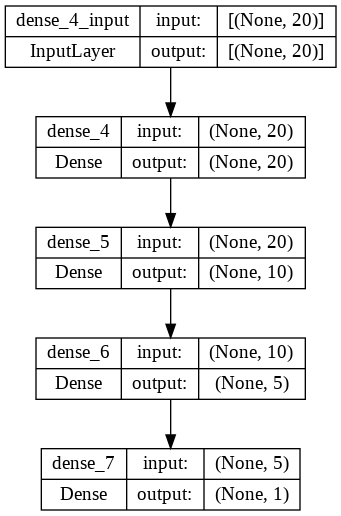

In [56]:
tf.keras.utils.plot_model(model, show_shapes= True)

In [57]:
opt = Adam(learning_rate=0.0001)
model.compile(optimizer = opt,loss="binary_crossentropy",metrics=["accuracy"])

In [58]:
history = model.fit(x_train,y_train,batch_size=150,epochs=300,
                      callbacks=[earlystopping],validation_data=(x_test,y_test))

Epoch 1/300
736/736 [==============================] - 3s 3ms/step - loss: 0.6639 - accuracy: 0.6374 - val_loss: 0.5880 - val_accuracy: 0.7640
Epoch 2/300
736/736 [==============================] - 2s 2ms/step - loss: 0.5185 - accuracy: 0.7672 - val_loss: 0.4867 - val_accuracy: 0.7651
Epoch 3/300
736/736 [==============================] - 2s 2ms/step - loss: 0.4762 - accuracy: 0.7725 - val_loss: 0.4747 - val_accuracy: 0.7715
Epoch 4/300
736/736 [==============================] - 2s 2ms/step - loss: 0.4677 - accuracy: 0.7775 - val_loss: 0.4690 - val_accuracy: 0.7744
Epoch 5/300
736/736 [==============================] - 2s 2ms/step - loss: 0.4632 - accuracy: 0.7793 - val_loss: 0.4659 - val_accuracy: 0.7756
Epoch 6/300
736/736 [==============================] - 2s 2ms/step - loss: 0.4604 - accuracy: 0.7806 - val_loss: 0.4637 - val_accuracy: 0.7776
Epoch 7/300
736/736 [==============================] - 2s 2ms/step - loss: 0.4583 - accuracy: 0.7816 - val_loss: 0.4622 - val_accuracy: 0.7786

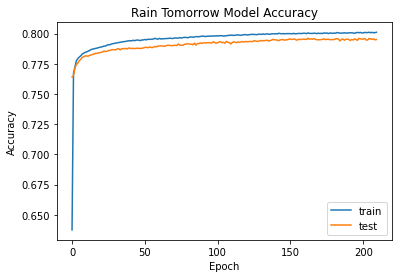

In [59]:
from matplotlib import pyplot
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='test')
pyplot.title('Rain Tomorrow Model Accuracy')
pyplot.ylabel('Accuracy')
pyplot.xlabel('Epoch')
pyplot.legend(['train','test'],loc='lower right')
pyplot.show()

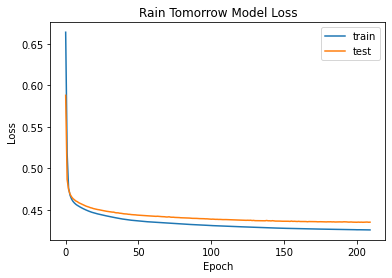

In [60]:
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history
            .history['val_loss'], label='test')
pyplot.title('Rain Tomorrow Model Loss')
pyplot.ylabel('Loss')
pyplot.xlabel('Epoch')
pyplot.legend()
pyplot.show()

## Predicting Rain Tomorrow

In [61]:
test_loss, test_acc = model.evaluate(x_test,y_test)

print('Test accuracy:', test_acc)

863/863 [==============================] - 1s 1ms/step - loss: 0.4361 - accuracy: 0.7954
Test accuracy: 0.7953597903251648


In [62]:
predictions = model.predict(x_test)

863/863 [==============================] - 1s 1ms/step


In [63]:
predicted_final = np.argmax(predictions,axis=1)

from sklearn.metrics import accuracy_score
accuracy_score(y_test,predicted_final)

0.5886170019938373

In [64]:
print(predicted_final)

[0 0 0 ... 0 0 0]


In [65]:
print("the actual label :",y_test[8])
print("the predicted label :",predicted_final[8])

the actual label : 0.0
the predicted label : 0


In [66]:
print("the actual label :",y_test[50])
print("the predicted label :",predicted_final[50])

the actual label : 0.0
the predicted label : 0


#Evaluation and results explaination

- False Positive:
- False Negative: 
- True Positives: 
- True Negatives: 

Recall: tells us out of all the positive class, how many did the model capture? 
- TP / (TP + FN)   = 

Precision: tells us out of all the predicted positive class, how many are actually positive?
- TP / (TP + FP) = 

F1-score is the weighted average of precision and recall, and is useful if we care both about precision and recall or want to compare models' performance. 


In [67]:
from sklearn.metrics import confusion_matrix
cf_matrix=confusion_matrix(y_test,predicted_final)
print(cf_matrix)              #column actual / row predicated 
from sklearn.metrics import classification_report
print("Confusion report : \n",classification_report(y_test,predicted_final ))

[[16237     0]
 [11348     0]]
Confusion report : 
               precision    recall  f1-score   support

         0.0       0.59      1.00      0.74     16237
         1.0       0.00      0.00      0.00     11348

    accuracy                           0.59     27585
   macro avg       0.29      0.50      0.37     27585
weighted avg       0.35      0.59      0.44     27585



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



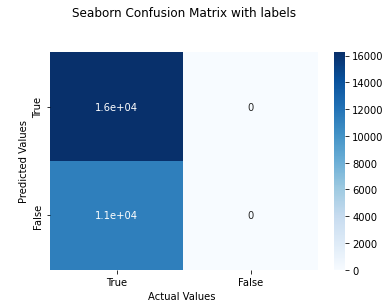

In [68]:
import seaborn as sns

ax = sns.heatmap(cf_matrix,annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_ylabel('\nPredicted Values')
ax.set_xlabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['True','False'])
ax.yaxis.set_ticklabels(['True','False'])

## Display the visualization of the Confusion Matrix.
plt.show()

## Testing using Random Forest Algorithm

In [71]:
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(x_train,y_train)

# prediction on test set
y_pred=clf.predict(x_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8916440094254123


In [72]:
print("the actual label :",y_test[135])
print("the predicted label :",y_pred[135])

the actual label : 1.0
the predicted label : 0.0


In [73]:
print("the actual label :",y_test[55])
print("the predicted label :",y_pred[55])

the actual label : 0.0
the predicted label : 0.0


In [74]:
print("the actual label :",y_test[30])
print("the predicted label :",y_pred[30])

the actual label : 1.0
the predicted label : 1.0


In [75]:
print("the actual label :",y_test[555])
print("the predicted label :",y_pred[555])

the actual label : 0.0
the predicted label : 0.0


In [76]:

cf_matrix=confusion_matrix(y_test,y_pred)
print(cf_matrix)              #column actual / row predicated 
from sklearn.metrics import classification_report
print("Confusion report : \n",classification_report(y_test,y_pred ))

[[14664  1573]
 [ 1416  9932]]
Confusion report : 
               precision    recall  f1-score   support

         0.0       0.91      0.90      0.91     16237
         1.0       0.86      0.88      0.87     11348

    accuracy                           0.89     27585
   macro avg       0.89      0.89      0.89     27585
weighted avg       0.89      0.89      0.89     27585



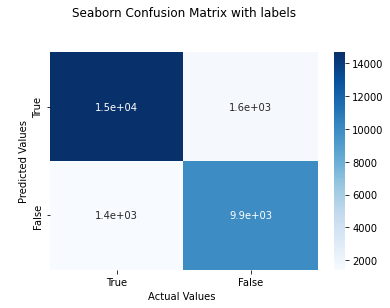

In [77]:
ax = sns.heatmap(cf_matrix,annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_ylabel('\nPredicted Values')
ax.set_xlabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['True','False'])
ax.yaxis.set_ticklabels(['True','False'])

## Display the visualization of the Confusion Matrix.
plt.show()

##Next steps
 - Predict rainy days on the long term by training classification models on the target variable RainTomorrow using a time series problem